In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

from glob import glob
from collections import Counter

#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!pip install ultralytics

In [3]:
from ultralytics import YOLO
!yolo checks

Ultralytics YOLOv8.2.10 🚀 Python-3.10.13 torch-2.1.2+cpu CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5597.6/8062.4 GB disk)

OS                  Linux-5.15.133+-x86_64-with-glibc2.31
Environment         Kaggle
Python              3.10.13
Install             pip
RAM                 31.36 GB
CPU                 Intel Xeon 2.20GHz
CUDA                None

matplotlib          ✅ 3.7.5>=3.3.0
opencv-python       ✅ 4.9.0.80>=4.6.0
pillow              ✅ 9.5.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.1.2+cpu>=1.8.0
torchvision         ✅ 0.16.2+cpu>=0.9.0
tqdm                ✅ 4.66.1>=4.64.0
psutil              ✅ 5.9.7
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1
pandas              ✅ 2.2.2>=1.1.4
seaborn             ✅ 0.12.2>=0.11.0


In [4]:
N = 5  
for dirname, _, filenames in os.walk('/kaggle/input'):
    print(f"Directory: {dirname}")
    for filename in filenames[:N]:  
        print(os.path.join(dirname, filename))
    if len(filenames) > N:
        print("... and more files")

Directory: /kaggle/input
Directory: /kaggle/input/tomato-leaf-diseases-detection-computer-vision
/kaggle/input/tomato-leaf-diseases-detection-computer-vision/README.dataset.txt
/kaggle/input/tomato-leaf-diseases-detection-computer-vision/README.roboflow.txt
/kaggle/input/tomato-leaf-diseases-detection-computer-vision/data.yaml
Directory: /kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid
Directory: /kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/labels
/kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/labels/IMG_0272_JPG.rf.09589608e4153af9abd9d62ebc699e3f.txt
/kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/labels/IMG_0360_JPG.rf.acbc78f9aaeed09a388f2f0fb8ffb92a.txt
/kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/labels/IMG_0230_JPG.rf.6aa737da228dfd6ab26b74bbcd84b98e.txt
/kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/labels/IMG_0366_JPG.rf.4aef33c7c8c8f5a462d6b4bfb2354b9e.txt


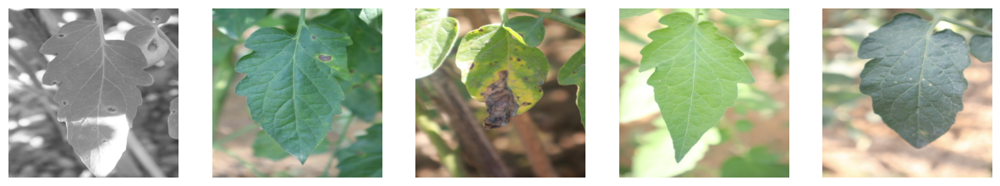

In [5]:
def show_images(directory, num_images=5): 
    # Список файлов директории:
    files = [os.path.join(directory, f) for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
    
    # Оставляем только изображения:
    image_files = [f for f in files if f.lower().endswith('.jpg')]
    
    plt.figure(figsize=(15, 10))
    
    for i, image_file in enumerate(image_files[:num_images]):
        img = Image.open(image_file)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()
    
show_images(
    '/kaggle/input/tomato-leaf-diseases-detection-computer-vision/train/images',
    num_images=5
)

In [6]:
def load_boxes(label_path, image_size, class_labels):
    
    boxes = []
    
    with open(label_path, 'r') as file:
        for line in file:
            class_id, x_center, y_center, width, height = map(float, line.split())  # Добавлен y_center
            x = (x_center - width / 2) * image_size[0]
            y = (y_center - height / 2) * image_size[1]
            w = width * image_size[0]
            h = height * image_size[1]
            class_name = class_labels[int(class_id)]
            boxes.append((x, y, w, h, class_name))
            
    return boxes

In [7]:
def show_image_with_boxes(image_path, label_path, class_labels):
    
    image = Image.open(image_path)
    boxes = load_boxes(label_path, image.size, class_labels)
    draw = ImageDraw.Draw(image)
    
    font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
    font = ImageFont.truetype(font_path, size=16)
    
    for box in boxes:
        x, y, w, h, class_name = box
        draw.rectangle([x, y, x + w, y + h], outline='red', width=2)
        draw.text((x, y - 18), class_name, fill="black", font=font)
        
    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [8]:
def find_pairs_and_show_boxes(images_dir, labels_dir, class_labels, max_images=5):
    
    image_files = [f for f in os.listdir(images_dir) if f.lower().endswith('.jpg')]
    num_displayed = 0
    
    for image_file in image_files:
        if num_displayed >= max_images:
            break
            
        base_name = os.path.splitext(image_file)[0]
        label_file = f"{base_name}.txt"
        label_path = os.path.join(labels_dir, label_file)
        image_path = os.path.join(images_dir, image_file)
        
        if os.path.exists(label_path):
            show_image_with_boxes(image_path, label_path, class_labels)
            num_displayed += 1

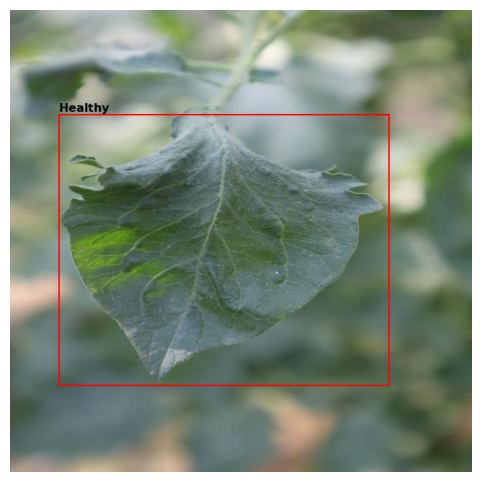

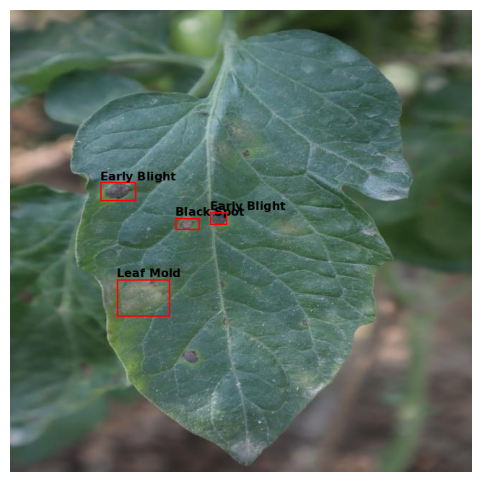

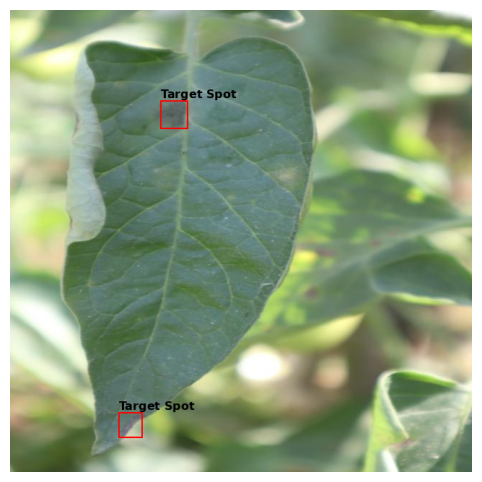

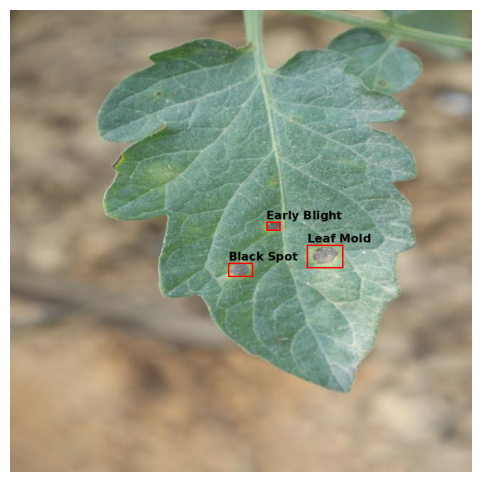

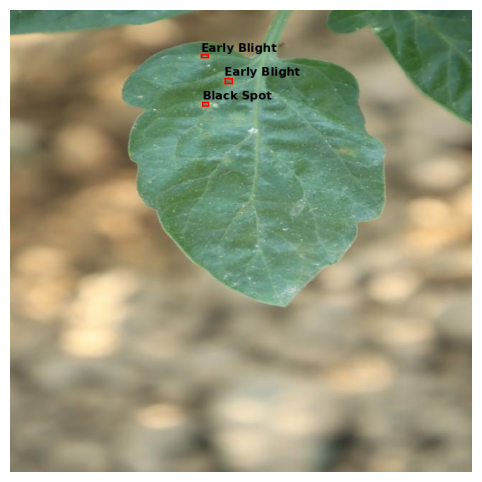

In [9]:

class_labels = [
    'Bacterial Spot', 'Early Blight', 'Healthy', 'Late Blight', 
    'Leaf Mold', 'Target Spot', 'Black Spot'
]

find_pairs_and_show_boxes(
    '/kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/images',
    '/kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/labels',
    class_labels, 
    max_images=5
)

In [10]:
def count_labels(label_dir, class_labels):
    label_counts = Counter()
    for filename in os.listdir(label_dir):
        if filename.endswith('.txt'):
            path = os.path.join(label_dir, filename)
            with open(path, 'r') as file:
                for line in file:
                    class_id = int(line.split()[0])
                    label = class_labels[class_id]
                    label_counts[label] += 1
    return label_counts

label_counts = count_labels('/kaggle/input/tomato-leaf-diseases-detection-computer-vision/train/labels', class_labels)
print(label_counts)


Counter({'Early Blight': 1090, 'Black Spot': 371, 'Late Blight': 291, 'Healthy': 162, 'Leaf Mold': 87, 'Bacterial Spot': 84, 'Target Spot': 39})


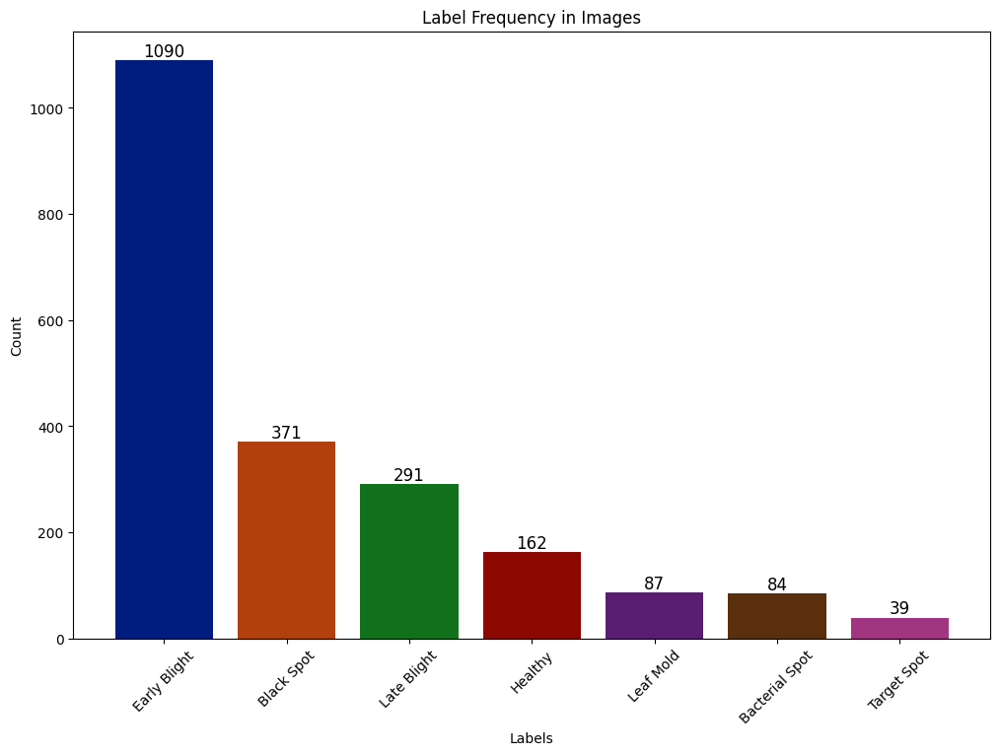

In [11]:
def plot_label_histogram(label_counts):

    labels, counts = zip(*sorted(label_counts.items(), key=lambda x: x[1], reverse=True))

    palette = sns.color_palette("dark", len(labels))

    plt.figure(figsize=(12, 8))
    bars = plt.bar(labels, counts, color=palette)
    plt.xlabel('Labels')
    plt.ylabel('Count')
    plt.title('Label Frequency in Images')
    plt.xticks(rotation=45)
    
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, str(height), ha='center', va='bottom', fontsize=12)
    
    plt.show()

plot_label_histogram(label_counts)


In [12]:
model=YOLO('yolov8n')
#print(model)

In [13]:
def train_and_validate_yolo(data_path):
    model = YOLO('yolov8n')  
    
    results = model.train(
        data=data_path,
        epochs=80,
        imgsz=640,
        batch=16
    )

    model.save('best_model.pt')

data_yaml = '/kaggle/input/tomato-leaf-diseases-detection-computer-vision/data.yaml'
train_and_validate_yolo(data_yaml)


Ultralytics YOLOv8.2.10 🚀 Python-3.10.13 torch-2.1.2+cpu CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/input/tomato-leaf-diseases-detection-computer-vision/data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False,

2024-05-07 11:54:50,359	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-07 11:54:51,001	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-07 11:54:53.491826: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-07 11:54:53.492021: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-07 11:54:53.652313: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLA

Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Currently logged in as: filipchenko-elena (filipchenko_elena). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'


train: Scanning /kaggle/input/tomato-leaf-diseases-detection-computer-vision/train/labels... 645 images, 18 backgrounds, 0 corrupt: 100%|██████████| 645/645 [00:01<00:00, 492.49it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/tomato-leaf-diseases-detection-computer-vision/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid/labels... 61 images, 2 backgrounds, 0 corrupt: 100%|██████████| 61/61 [00:00<00:00, 364.21it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/tomato-leaf-diseases-detection-computer-vision/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80         0G      1.495      3.447      1.255         16        640: 100%|██████████| 41/41 [04:36<00:00,  6.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.45s/it]

                   all         61        196      0.016      0.163      0.131      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80         0G      1.413      2.333      1.213         35        640: 100%|██████████| 41/41 [04:30<00:00,  6.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.19s/it]

                   all         61        196      0.982      0.102      0.219      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80         0G      1.483      2.214      1.219         32        640: 100%|██████████| 41/41 [04:28<00:00,  6.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.12s/it]

                   all         61        196      0.698       0.18      0.243      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80         0G      1.403       2.03      1.202         22        640: 100%|██████████| 41/41 [04:49<00:00,  7.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.54s/it]

                   all         61        196      0.966       0.19      0.308      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80         0G      1.399       1.96      1.202         39        640: 100%|██████████| 41/41 [04:31<00:00,  6.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.23s/it]

                   all         61        196       0.84      0.275      0.351      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80         0G      1.369      1.791      1.185         13        640: 100%|██████████| 41/41 [04:38<00:00,  6.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.20s/it]

                   all         61        196      0.387      0.417       0.37      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80         0G      1.349      1.659      1.161         28        640: 100%|██████████| 41/41 [04:42<00:00,  6.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.12s/it]

                   all         61        196      0.852      0.293      0.387       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80         0G      1.302      1.552      1.163         30        640: 100%|██████████| 41/41 [04:41<00:00,  6.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.30s/it]

                   all         61        196      0.756      0.359      0.385      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80         0G      1.292      1.449      1.133         44        640: 100%|██████████| 41/41 [04:40<00:00,  6.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.89s/it]

                   all         61        196      0.499      0.438      0.448      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80         0G      1.282      1.451      1.133         22        640: 100%|██████████| 41/41 [04:36<00:00,  6.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.27s/it]

                   all         61        196       0.47      0.494      0.461      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80         0G      1.255      1.356      1.133         12        640: 100%|██████████| 41/41 [04:34<00:00,  6.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.31s/it]

                   all         61        196      0.348      0.308      0.338      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80         0G      1.211      1.328      1.096         28        640: 100%|██████████| 41/41 [04:33<00:00,  6.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.99s/it]

                   all         61        196      0.617      0.521      0.517      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80         0G      1.212      1.271      1.102         13        640: 100%|██████████| 41/41 [04:44<00:00,  6.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.52s/it]

                   all         61        196      0.705      0.432      0.511      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80         0G      1.222      1.217      1.084         15        640: 100%|██████████| 41/41 [04:45<00:00,  6.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.18s/it]

                   all         61        196      0.454      0.558      0.499      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80         0G      1.141      1.167      1.081         14        640: 100%|██████████| 41/41 [04:37<00:00,  6.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.54s/it]

                   all         61        196      0.516      0.516      0.516      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80         0G      1.213      1.164      1.102         44        640: 100%|██████████| 41/41 [04:44<00:00,  6.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.01s/it]

                   all         61        196      0.701       0.57      0.568      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80         0G       1.14      1.073      1.063         31        640: 100%|██████████| 41/41 [04:50<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.14s/it]

                   all         61        196      0.717      0.536        0.6      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80         0G      1.146      1.078      1.079         33        640: 100%|██████████| 41/41 [04:55<00:00,  7.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.02s/it]

                   all         61        196      0.523      0.547      0.534      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80         0G      1.149      1.059      1.071         23        640: 100%|██████████| 41/41 [04:50<00:00,  7.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.15s/it]

                   all         61        196      0.647      0.629       0.61      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80         0G      1.111      1.018      1.058         16        640: 100%|██████████| 41/41 [04:38<00:00,  6.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.55s/it]

                   all         61        196      0.762      0.585       0.63      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80         0G      1.109      1.015      1.074         14        640: 100%|██████████| 41/41 [04:45<00:00,  6.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.37s/it]

                   all         61        196      0.695      0.667      0.648      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80         0G      1.089     0.9398      1.038         16        640: 100%|██████████| 41/41 [04:44<00:00,  6.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.23s/it]

                   all         61        196       0.64      0.657      0.642       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80         0G      1.112     0.9845      1.069         32        640: 100%|██████████| 41/41 [04:50<00:00,  7.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  5.00s/it]

                   all         61        196      0.691      0.605      0.641      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80         0G      1.032     0.9072      1.022         25        640: 100%|██████████| 41/41 [04:49<00:00,  7.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.22s/it]

                   all         61        196      0.669      0.621      0.667      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80         0G        1.1      0.934      1.039         22        640: 100%|██████████| 41/41 [04:44<00:00,  6.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.88s/it]

                   all         61        196      0.622      0.617       0.65      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80         0G      1.073     0.8809       1.04         12        640: 100%|██████████| 41/41 [04:23<00:00,  6.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.48s/it]

                   all         61        196      0.661      0.609      0.666      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80         0G      1.042      0.847      1.012         44        640: 100%|██████████| 41/41 [04:35<00:00,  6.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.04s/it]

                   all         61        196      0.741      0.641      0.659       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80         0G      1.074     0.8955      1.017         45        640: 100%|██████████| 41/41 [04:43<00:00,  6.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.99s/it]

                   all         61        196       0.72      0.597       0.67      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80         0G      1.092     0.8909       1.03         39        640: 100%|██████████| 41/41 [04:40<00:00,  6.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.37s/it]

                   all         61        196      0.731      0.643      0.701      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80         0G      1.029     0.8529      1.013         17        640: 100%|██████████| 41/41 [04:40<00:00,  6.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.51s/it]

                   all         61        196      0.726       0.57      0.665      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80         0G      1.028      0.843       1.02         22        640: 100%|██████████| 41/41 [04:50<00:00,  7.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.12s/it]

                   all         61        196      0.617      0.638      0.645       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80         0G      1.038      0.846      1.014         26        640: 100%|██████████| 41/41 [04:49<00:00,  7.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.01s/it]

                   all         61        196      0.692      0.671      0.696      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80         0G      1.006     0.8053     0.9912         33        640: 100%|██████████| 41/41 [04:48<00:00,  7.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.46s/it]

                   all         61        196      0.769      0.645      0.692      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80         0G     0.9818     0.7798     0.9956         29        640: 100%|██████████| 41/41 [04:50<00:00,  7.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.22s/it]

                   all         61        196      0.655      0.681      0.677      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80         0G     0.9814     0.8002      1.005         31        640: 100%|██████████| 41/41 [04:52<00:00,  7.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.20s/it]

                   all         61        196      0.697      0.609       0.67      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80         0G     0.9722     0.7528     0.9868         34        640: 100%|██████████| 41/41 [04:44<00:00,  6.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.95s/it]

                   all         61        196      0.598      0.729      0.671      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80         0G     0.9619     0.7571     0.9796         32        640: 100%|██████████| 41/41 [04:50<00:00,  7.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.13s/it]

                   all         61        196       0.76      0.615      0.693      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80         0G     0.9762     0.7787     0.9958         24        640: 100%|██████████| 41/41 [04:52<00:00,  7.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.52s/it]

                   all         61        196      0.645      0.655      0.679      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80         0G     0.9875     0.7485     0.9919         36        640: 100%|██████████| 41/41 [04:48<00:00,  7.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.14s/it]

                   all         61        196      0.663      0.681      0.646      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80         0G     0.9553     0.7293     0.9808         20        640: 100%|██████████| 41/41 [04:45<00:00,  6.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.67s/it]

                   all         61        196      0.739      0.666      0.677      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80         0G     0.9346      0.726     0.9847         25        640: 100%|██████████| 41/41 [04:40<00:00,  6.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.03s/it]

                   all         61        196       0.75      0.694      0.714      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80         0G     0.9569     0.7259      0.983         24        640: 100%|██████████| 41/41 [04:49<00:00,  7.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.42s/it]

                   all         61        196      0.812      0.678      0.734      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80         0G     0.9308     0.7062     0.9865         18        640: 100%|██████████| 41/41 [04:49<00:00,  7.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.94s/it]

                   all         61        196      0.794      0.647      0.709      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80         0G     0.9502     0.7224     0.9848         18        640: 100%|██████████| 41/41 [04:36<00:00,  6.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.07s/it]

                   all         61        196      0.734      0.685      0.709      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80         0G     0.9544     0.7393     0.9846         21        640: 100%|██████████| 41/41 [04:45<00:00,  6.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.21s/it]

                   all         61        196      0.772      0.718      0.739      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80         0G     0.9479     0.7189     0.9834         32        640: 100%|██████████| 41/41 [04:39<00:00,  6.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.21s/it]

                   all         61        196      0.754      0.649      0.712      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80         0G     0.9474      0.692     0.9769         16        640: 100%|██████████| 41/41 [04:53<00:00,  7.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.23s/it]

                   all         61        196      0.699      0.686      0.713      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80         0G      0.877     0.6429     0.9723         23        640: 100%|██████████| 41/41 [04:48<00:00,  7.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.75s/it]

                   all         61        196      0.814      0.695      0.754      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80         0G     0.8836     0.6964     0.9743         25        640: 100%|██████████| 41/41 [04:45<00:00,  6.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.18s/it]

                   all         61        196      0.733      0.672      0.698      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80         0G       0.88     0.6708     0.9628         22        640: 100%|██████████| 41/41 [04:44<00:00,  6.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.17s/it]

                   all         61        196      0.706      0.706      0.708      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80         0G     0.8898      0.634     0.9624         13        640: 100%|██████████| 41/41 [04:42<00:00,  6.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.97s/it]

                   all         61        196      0.806      0.709      0.755      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80         0G     0.9241     0.6548     0.9729         24        640: 100%|██████████| 41/41 [04:53<00:00,  7.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.07s/it]

                   all         61        196      0.747      0.734      0.746      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80         0G     0.8825     0.6376     0.9542         20        640: 100%|██████████| 41/41 [04:44<00:00,  6.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.64s/it]

                   all         61        196      0.783      0.691      0.748      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80         0G      0.885      0.635     0.9557         29        640: 100%|██████████| 41/41 [04:54<00:00,  7.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.47s/it]

                   all         61        196      0.707      0.742      0.717      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80         0G      0.863     0.6402     0.9563         35        640: 100%|██████████| 41/41 [04:39<00:00,  6.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.12s/it]

                   all         61        196      0.769      0.747      0.724      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80         0G     0.8592     0.6262     0.9496         36        640: 100%|██████████| 41/41 [04:39<00:00,  6.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.25s/it]

                   all         61        196      0.702      0.706        0.7       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80         0G      0.846      0.608     0.9518         32        640: 100%|██████████| 41/41 [04:44<00:00,  6.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.22s/it]

                   all         61        196      0.727      0.717      0.714      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80         0G     0.8968     0.6272     0.9601         35        640: 100%|██████████| 41/41 [04:53<00:00,  7.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.25s/it]

                   all         61        196      0.715        0.7      0.702      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80         0G     0.8731     0.6258     0.9373         13        640: 100%|██████████| 41/41 [04:50<00:00,  7.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.08s/it]

                   all         61        196      0.804      0.648      0.707      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80         0G      0.812     0.6062     0.9377         16        640: 100%|██████████| 41/41 [04:40<00:00,  6.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.62s/it]

                   all         61        196      0.786      0.658      0.738      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80         0G     0.8633     0.6268     0.9559         24        640: 100%|██████████| 41/41 [04:40<00:00,  6.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.15s/it]

                   all         61        196       0.79      0.676      0.741      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80         0G     0.8473     0.6068     0.9405         38        640: 100%|██████████| 41/41 [04:44<00:00,  6.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.12s/it]

                   all         61        196      0.751      0.726       0.75      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80         0G     0.8164     0.5886     0.9438         23        640: 100%|██████████| 41/41 [04:33<00:00,  6.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.61s/it]

                   all         61        196      0.696      0.727      0.714      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80         0G     0.8534     0.6141     0.9353         13        640: 100%|██████████| 41/41 [04:27<00:00,  6.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.77s/it]

                   all         61        196      0.807      0.668      0.738      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80         0G     0.8235     0.5802     0.9412         31        640: 100%|██████████| 41/41 [04:37<00:00,  6.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.92s/it]

                   all         61        196      0.801      0.675      0.725      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80         0G     0.8221     0.5922      0.938         11        640: 100%|██████████| 41/41 [04:33<00:00,  6.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.91s/it]

                   all         61        196      0.811      0.731      0.746      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80         0G     0.7867     0.5727     0.9273         35        640: 100%|██████████| 41/41 [04:38<00:00,  6.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.19s/it]

                   all         61        196      0.754      0.754      0.753      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80         0G     0.7997     0.5672       0.93         13        640: 100%|██████████| 41/41 [04:46<00:00,  6.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.89s/it]

                   all         61        196      0.837      0.664      0.725      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80         0G     0.7619     0.5753      0.927         19        640: 100%|██████████| 41/41 [04:38<00:00,  6.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.90s/it]

                   all         61        196      0.836      0.659      0.729      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80         0G     0.8243     0.5941     0.9298         17        640: 100%|██████████| 41/41 [04:29<00:00,  6.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.27s/it]

                   all         61        196      0.678      0.743      0.729      0.484


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80         0G     0.8786     0.6054     0.9188         19        640: 100%|██████████| 41/41 [04:36<00:00,  6.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.25s/it]

                   all         61        196      0.726      0.715      0.721      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80         0G     0.8616      0.599     0.9159         24        640: 100%|██████████| 41/41 [04:45<00:00,  6.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.29s/it]

                   all         61        196      0.741      0.723      0.715      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80         0G     0.8512      0.583     0.9046         13        640: 100%|██████████| 41/41 [04:29<00:00,  6.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.24s/it]

                   all         61        196      0.757      0.758      0.741      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80         0G      0.836     0.5675     0.9099         13        640: 100%|██████████| 41/41 [04:41<00:00,  6.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.22s/it]

                   all         61        196      0.739      0.752      0.732      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80         0G     0.8295     0.5688     0.9063         18        640: 100%|██████████| 41/41 [04:26<00:00,  6.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.89s/it]

                   all         61        196      0.725      0.731      0.735       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80         0G     0.8469     0.5739     0.9073         24        640: 100%|██████████| 41/41 [04:41<00:00,  6.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.94s/it]

                   all         61        196      0.672      0.792      0.732      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80         0G     0.8168      0.572     0.9068         11        640: 100%|██████████| 41/41 [04:38<00:00,  6.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.48s/it]

                   all         61        196      0.674      0.784      0.736      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80         0G     0.8213     0.5665     0.9029         10        640: 100%|██████████| 41/41 [04:36<00:00,  6.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.04s/it]

                   all         61        196       0.73      0.775      0.753      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80         0G     0.8204     0.5641     0.9046         18        640: 100%|██████████| 41/41 [04:44<00:00,  6.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.27s/it]

                   all         61        196      0.774      0.706      0.746       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80         0G     0.7957     0.5488      0.894         15        640: 100%|██████████| 41/41 [04:44<00:00,  6.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.14s/it]

                   all         61        196      0.775      0.681      0.738      0.485



80 epochs completed in 6.527 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.10 🚀 Python-3.10.13 torch-2.1.2+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3007013 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.81s/it]


                   all         61        196       0.73      0.775      0.754      0.498
        Bacterial Spot         61          4          1      0.731      0.748      0.399
          Early_Blight         61         96      0.755      0.869      0.837        0.5
               Healthy         61         19      0.975          1      0.995       0.94
           Late_blight         61         29      0.795      0.937      0.921      0.759
             Leaf Mold         61          7      0.275      0.571      0.422      0.201
           Target_Spot         61          6      0.628      0.833      0.812      0.447
            black spot         61         35       0.68      0.486      0.539      0.241
Speed: 2.1ms preprocess, 129.3ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/train2


lr/pg0,▃████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▂▃▄▅▃▅▅▆▆▇▇▇▇▇▇▇▇▇▇█▇██▇████▇██████████
metrics/mAP50-95(B),▁▂▃▄▄▃▆▅▆▆▇▆▇▇▇▇▇▇▇▇▇▇██▇███▇▇▇████▇████
metrics/precision(B),▁▇██▅▄▇▅▇▆▇▇▆▇▇▆▇▇▇▆▇█▇▇▇█▇▇▇█▇▇█▇█▇▇▇▇▇
metrics/recall(B),▁▁▂▂▄▃▄▅▅▆▇▆▆▆▆▆▆▆▆▇▇▆▇▇▇▇▇█▇▆▇▇▇█▇▇█▇██
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,██▇▇▆▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▂▂▂▂▁


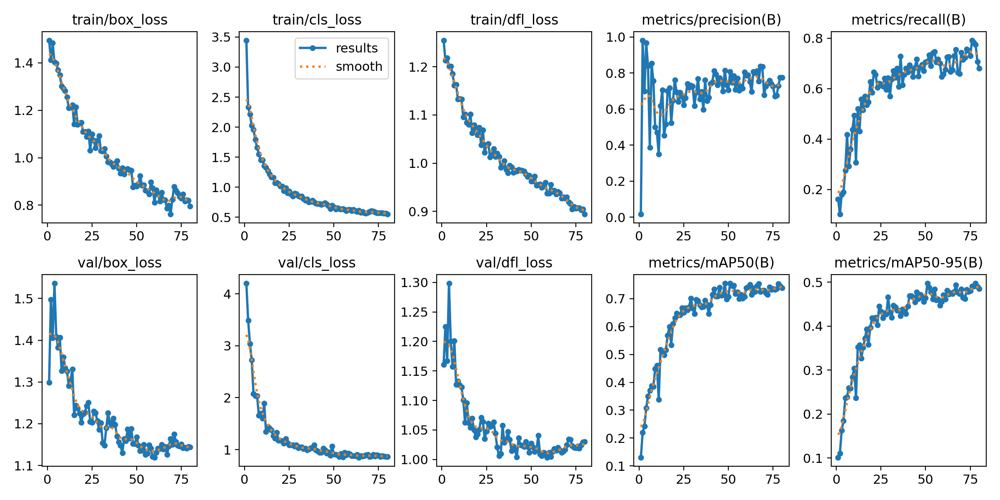

In [19]:
Image.open('/kaggle/working/runs/detect/train2/results.png')

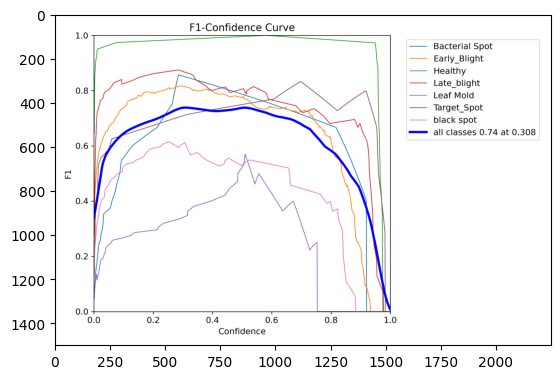

In [20]:
img = mpimg.imread('/kaggle/working/runs/detect/train2/F1_curve.png')
imgplot = plt.imshow(img)
plt.show()

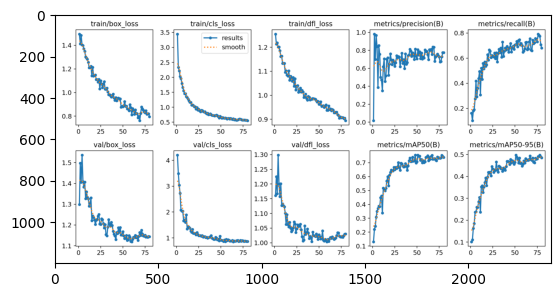

In [21]:
img = mpimg.imread('/kaggle/working/runs/detect/train2/results.png')
imgplot = plt.imshow(img)
plt.show()

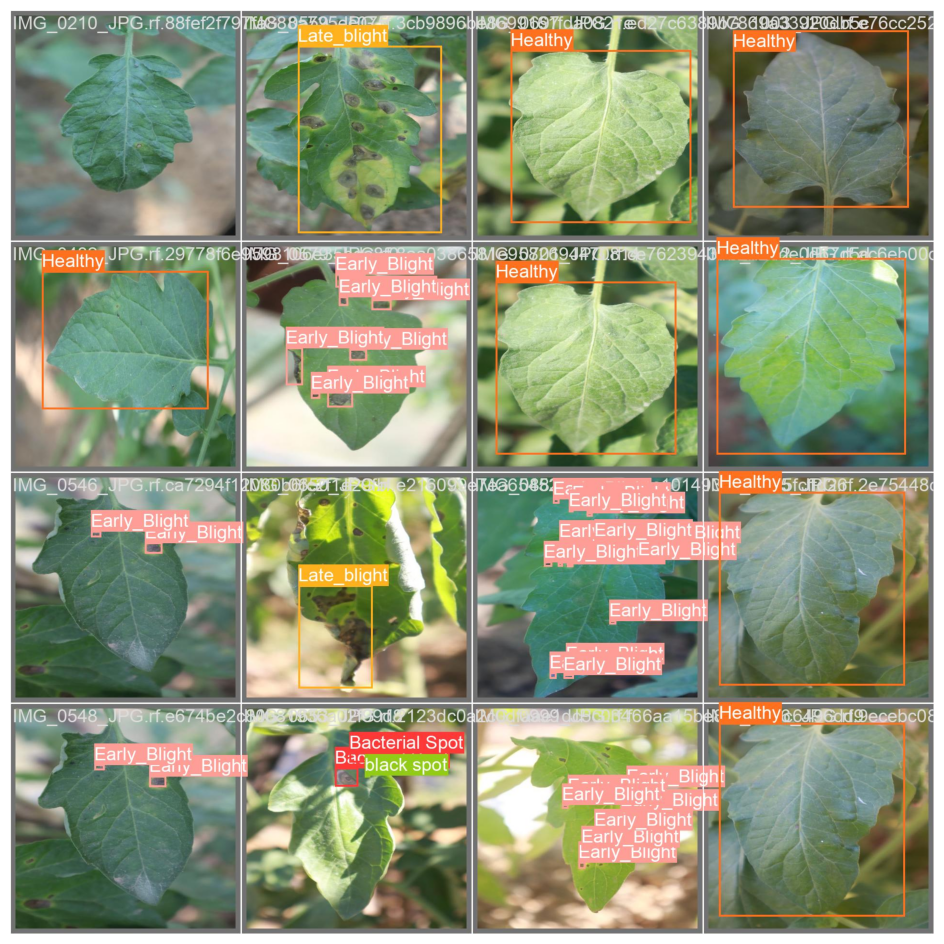

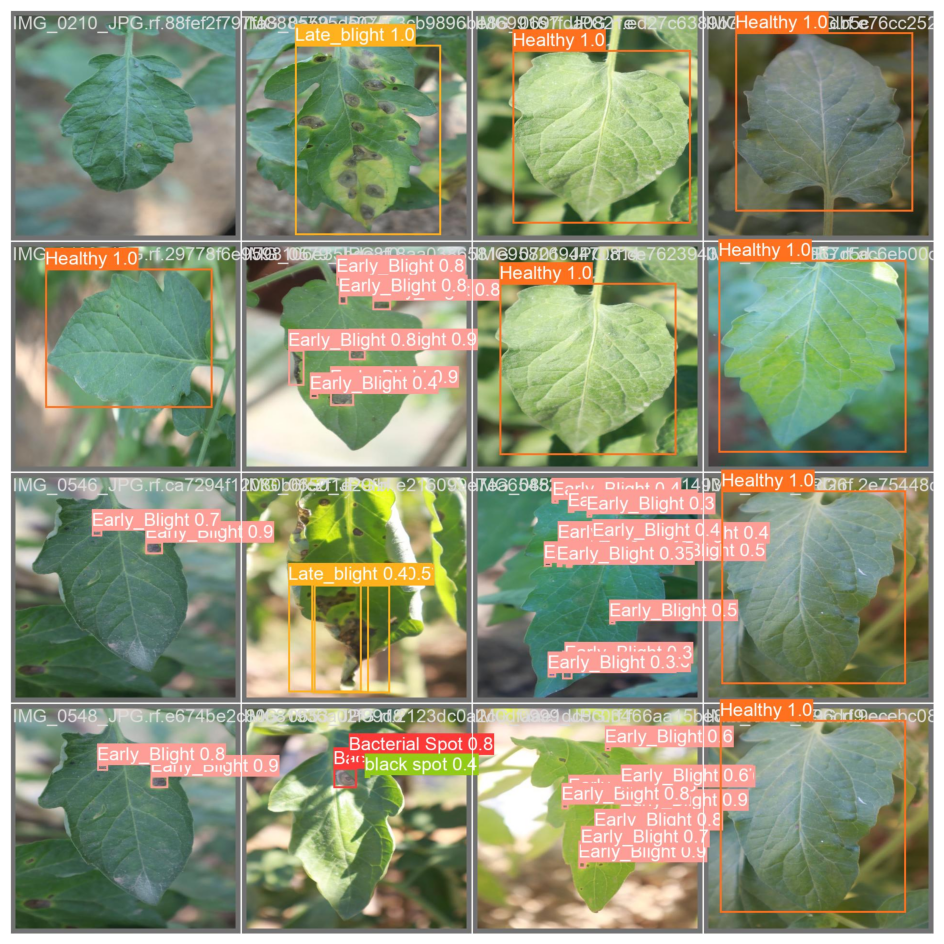

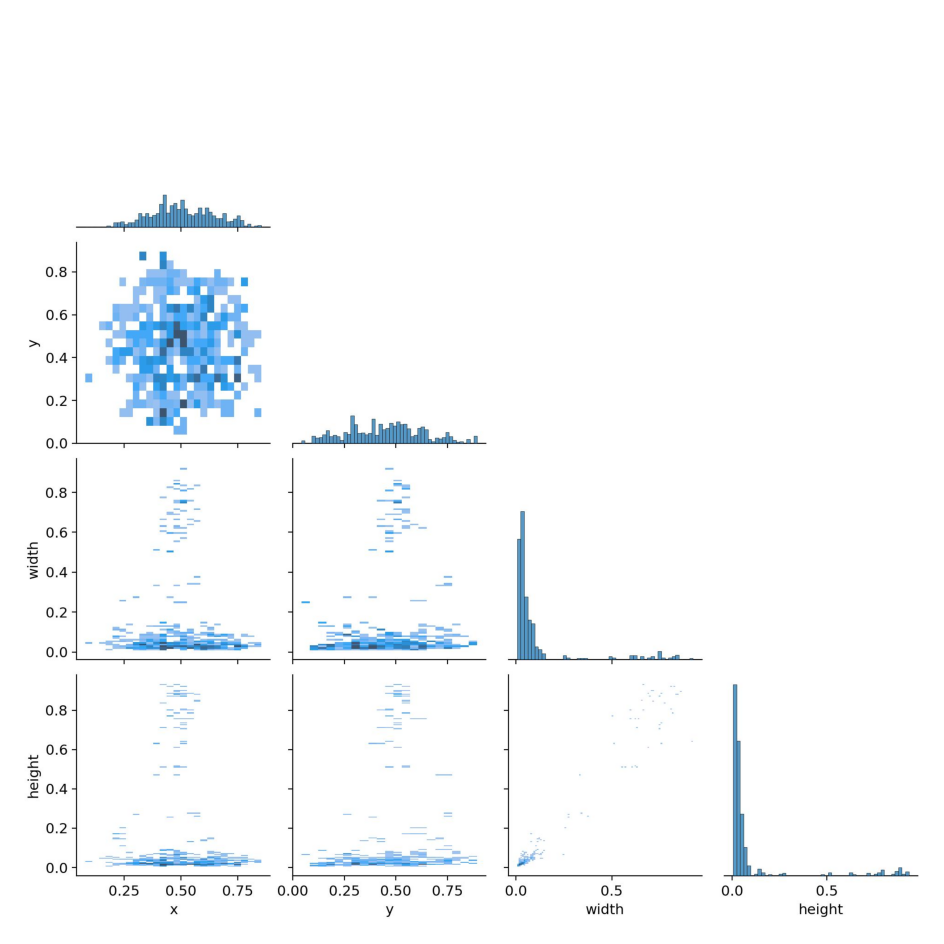

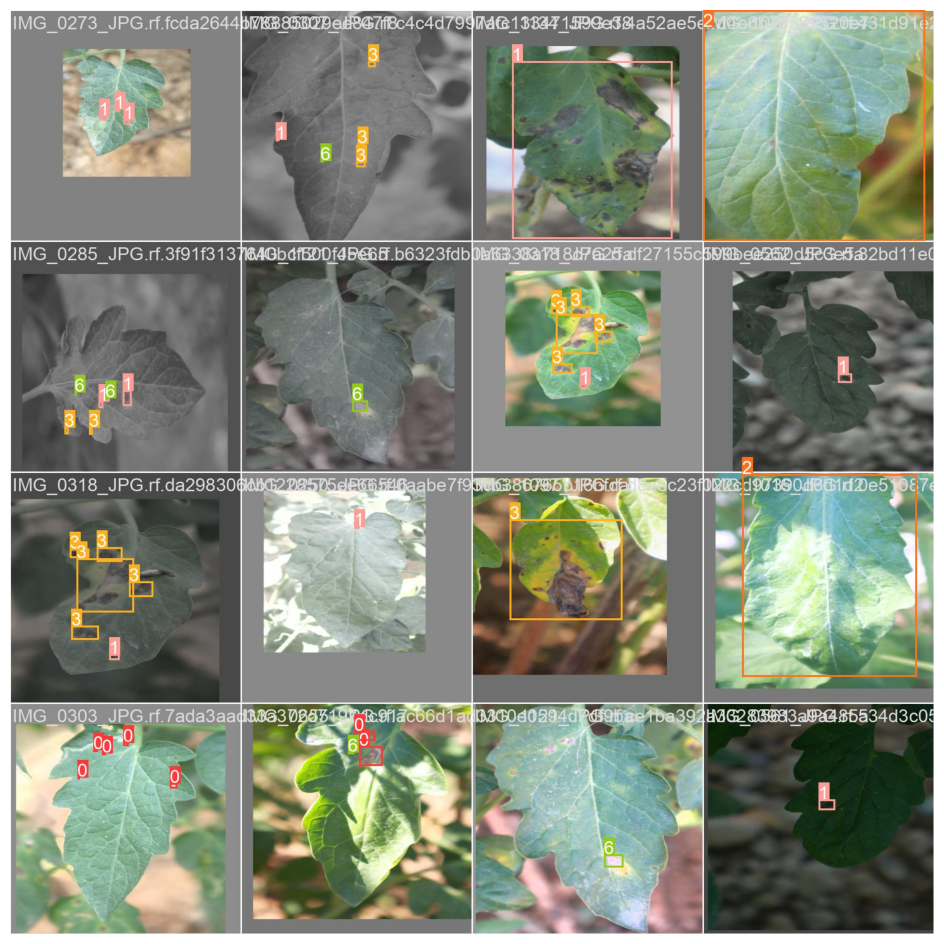

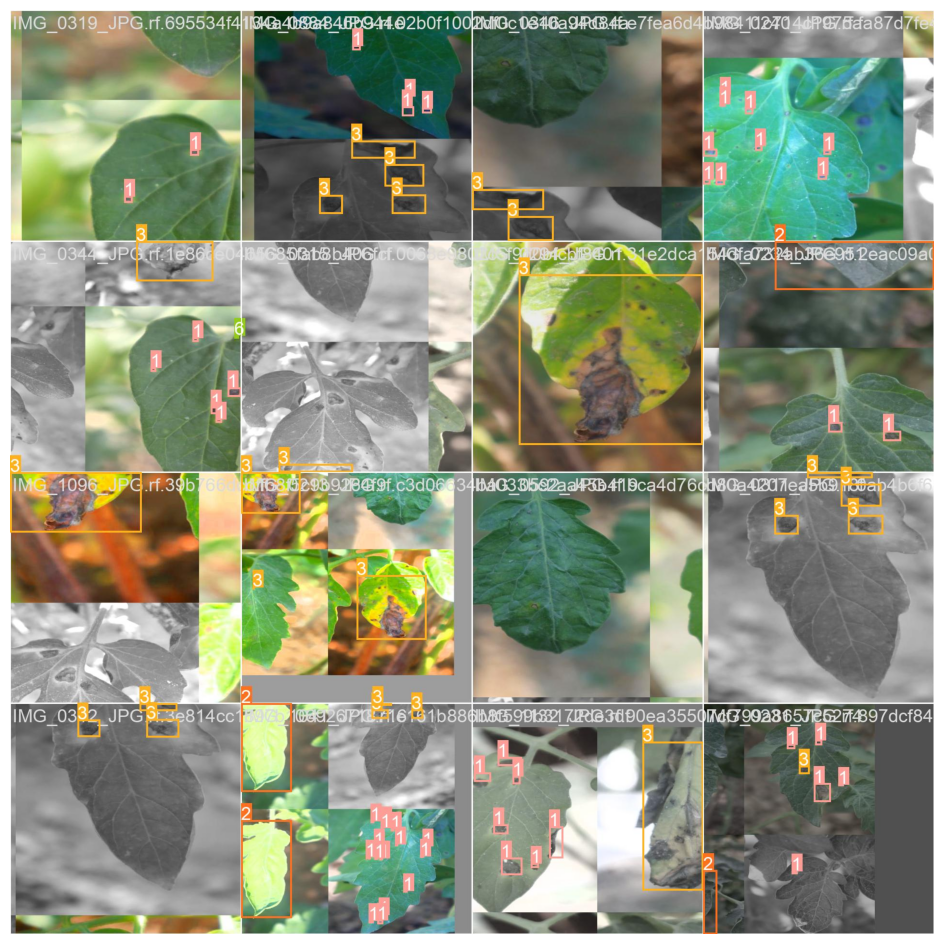

In [70]:
for image_path in glob('/kaggle/working/runs/detect/train2/*.jpg')[:5]:
    plt.figure(figsize=(20, 12))
    plt.imshow(Image.open(image_path))
    plt.axis("off")
    plt.show()
    print("\n")

In [40]:
loaded = torch.load('best_model.pt')
print(loaded.keys())

dict_keys(['epoch', 'best_fitness', 'model', 'ema', 'updates', 'optimizer', 'train_args', 'date', 'version', 'license', 'docs'])


In [ ]:
#model = loaded['model']
#model.eval()  

to be continued...